In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

In [8]:
df = pd.read_csv('Cleaned_DS_Jobs.csv')

In [9]:
df

,Job Title,Salary Estimate,Job Description,Rating,Company Name,Location,Headquarters,Size,Type of ownership,Industry,...,company_age,python,excel,hadoop,spark,aws,tableau,big_data,job_simp,seniority
0,Sr Data Scientist,137-171,Description\n\nThe Senior Data Scientist is re...,3.1,Healthfirst,"New York, NY","New York, NY",1001 to 5000 employees,Nonprofit Organization,Insurance Carriers,...,27,0,0,0,0,1,0,0,data scientist,senior
1,Data Scientist,137-171,"Secure our Nation, Ignite your Future\n\nJoin ...",4.2,ManTech,"Chantilly, VA","Herndon, VA",5001 to 10000 employees,Company - Public,Research & Development,...,52,0,0,1,0,0,0,1,data scientist,na
2,Data Scientist,137-171,Overview\n\n\nAnalysis Group is one of the lar...,3.8,Analysis Group,"Boston, MA","Boston, MA",1001 to 5000 employees,Private Practice / Firm,Consulting,...,39,1,1,0,0,1,0,0,data scientist,na
3,Data Scientist,137-171,JOB DESCRIPTION:\n\nDo you have a passion for ...,3.5,INFICON,"Newton, MA","Bad Ragaz, Switzerland",501 to 1000 employees,Company - Public,Electrical & Electronic Manufacturing,...,20,1,1,0,0,1,0,0,data scientist,na
4,Data Scientist,137-171,Data Scientist\nAffinity Solutions / Marketing...,2.9,Affinity Solutions,"New York, NY","New York, NY",51 to 200 employees,Company - Private,Advertising & Marketing,...,22,1,1,0,0,0,0,0,data scientist,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,Data Scientist,105-167,Summary\n\nWe’re looking for a data scientist ...,3.6,TRANZACT,"Fort Lee, NJ","Fort Lee, NJ",1001 to 5000 employees,Company - Private,Advertising & Marketing,...,31,1,1,1,0,0,1,1,data scientist,na
656,Data Scientist,105-167,Job Description\nBecome a thought leader withi...,0.0,JKGT,"San Francisco, CA",-1,-1,-1,-1,...,-1,0,0,0,0,0,0,0,data scientist,na
657,Data Scientist,105-167,Join a thriving company that is changing the w...,0.0,AccessHope,"Irwindale, CA",-1,-1,-1,-1,...,-1,1,1,1,0,0,1,0,data scientist,na
658,Data Scientist,105-167,100 Remote Opportunity As an AINLP Data Scient...,5.0,ChaTeck Incorporated,"San Francisco, CA","Santa Clara, CA",1 to 50 employees,Company - Private,Advertising & Marketing,...,-1,1,0,1,1,0,0,1,data scientist,na


In [10]:
df.columns

Index(['Job Title', 'Salary Estimate', 'Job Description', 'Rating',
       'Company Name', 'Location', 'Headquarters', 'Size', 'Type of ownership',
       'Industry', 'Sector', 'Revenue', 'min_salary', 'max_salary',
       'avg_salary', 'job_state', 'same_state', 'company_age', 'python',
       'excel', 'hadoop', 'spark', 'aws', 'tableau', 'big_data', 'job_simp',
       'seniority'],
      dtype='object')

In [13]:
def title_simplifier(title):
    if 'data scientist' in title.lower():
        return 'data scientist'
    elif 'data engineer' in title.lower():
        return 'data engineer'
    elif 'analyst' in title.lower():
        return 'analyst'
    elif 'machine learning' in title.lower():
        return 'mle'
    elif 'manager' in title.lower():
        return 'manager'
    elif 'director' in title.lower():
        return 'director'
    else:
        return 'na'

In [14]:
df['job_simp'] = df['Job Title'].apply(title_simplifier)
df.job_simp.value_counts()

data scientist    447
na                 68
analyst            55
data engineer      46
mle                34
manager             7
director            3
Name: job_simp, dtype: int64

In [15]:
def seniority(title):
    if 'sr' in title.lower() or 'senior' in title.lower() or 'sr' in title.lower() or 'lead' in title.lower() or 'principal' in title.lower():
            return 'senior'
    elif 'jr' in title.lower() or 'jr.' in title.lower():
        return 'jr'
    else:
        return 'na'

In [16]:
df['seniority'] = df['Job Title'].apply(seniority)
df.seniority.value_counts()

na        567
senior     92
jr          1
Name: seniority, dtype: int64

In [17]:
df['job_state']= df.job_state.apply(lambda x: x.strip() if x.strip().lower() != 'los angeles' else 'CA')
df.job_state.value_counts()

CA    165
VA     89
MA     62
NY     52
MD     40
IL     30
DC     26
TX     17
WA     16
OH     14
MO     12
PA     12
US     11
CO     10
NJ     10
NC      9
GA      9
FL      8
TN      8
OK      6
WI      6
IN      5
MI      5
AZ      4
AL      4
MN      4
CT      4
UT      3
NE      3
IA      3
OR      2
SC      2
RI      2
NH      2
LA      1
MS      1
KS      1
DE      1
WV      1
Name: job_state, dtype: int64

In [18]:
df['desc_len'] = df['Job Description'].apply(lambda x: len(x))
df['desc_len']

0      3389
1      4076
2      8749
3      3349
4      2728
       ... 
655    3653
656    1251
657    2793
658    3426
659    3000
Name: desc_len, Length: 660, dtype: int64

In [23]:
df['Industry'] = df.Industry.apply(lambda x: x.replace('\n', ''))
df['Industry']

0                         Insurance Carriers
1                     Research & Development
2                                 Consulting
3      Electrical & Electronic Manufacturing
4                    Advertising & Marketing
                       ...                  
655                  Advertising & Marketing
656                                       -1
657                                       -1
658                  Advertising & Marketing
659                                Wholesale
Name: Industry, Length: 660, dtype: object

In [24]:
df.describe()

,Rating,min_salary,max_salary,avg_salary,same_state,company_age,python,excel,hadoop,spark,aws,tableau,big_data,desc_len
count,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000
mean,3.587424,99.296970,148.301515,123.612121,0.407576,29.736364,0.730303,0.440909,0.212121,0.281818,0.260606,0.184848,0.206061,3481.328788
std,1.183540,33.161485,48.264588,39.786698,0.491756,39.763033,0.444139,0.496873,0.409120,0.450226,0.439298,0.388469,0.404781,1636.103170
min,0.000000,31.000000,56.000000,43.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,71.000000
25%,3.300000,79.000000,119.000000,103.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2402.250000
50%,3.800000,91.000000,133.000000,114.000000,0.000000,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3345.000000
75%,4.300000,122.000000,165.000000,136.000000,1.000000,37.250000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,4303.750000
max,5.000000,212.000000,331.000000,271.000000,1.000000,239.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,10524.000000


In [25]:
df.columns

Index(['Job Title', 'Salary Estimate', 'Job Description', 'Rating',
       'Company Name', 'Location', 'Headquarters', 'Size', 'Type of ownership',
       'Industry', 'Sector', 'Revenue', 'min_salary', 'max_salary',
       'avg_salary', 'job_state', 'same_state', 'company_age', 'python',
       'excel', 'hadoop', 'spark', 'aws', 'tableau', 'big_data', 'job_simp',
       'seniority', 'desc_len'],
      dtype='object')

<AxesSubplot:>

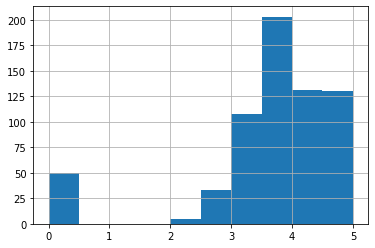

In [26]:
df.Rating.hist()

<AxesSubplot:>

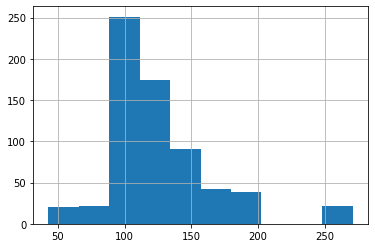

In [27]:
df.avg_salary.hist()

<AxesSubplot:>

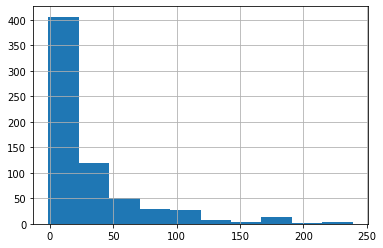

In [29]:
df.company_age.hist()

<AxesSubplot:>

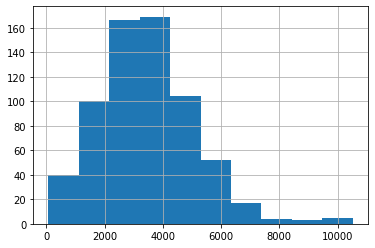

In [30]:
df.desc_len.hist()

<AxesSubplot:>

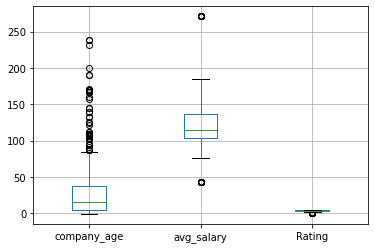

In [31]:
df.boxplot(column = ['company_age','avg_salary','Rating'])

<AxesSubplot:>

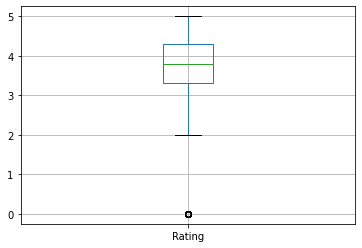

In [32]:
df.boxplot(column = 'Rating')

In [33]:
df[['company_age','avg_salary','Rating','desc_len']].corr()

,company_age,avg_salary,Rating,desc_len
company_age,1.000000,-0.045390,0.102369,0.249217
avg_salary,-0.045390,1.000000,-0.067593,0.002461
Rating,0.102369,-0.067593,1.000000,-0.024214
desc_len,0.249217,0.002461,-0.024214,1.000000


<AxesSubplot:>

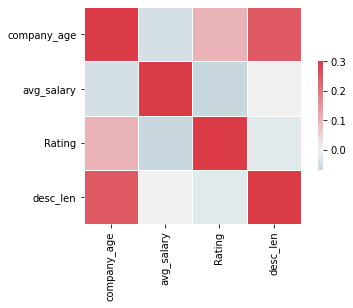

In [37]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df[['company_age','avg_salary','Rating','desc_len']].corr(),vmax=.3, center=0, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [38]:
df.columns

Index(['Job Title', 'Salary Estimate', 'Job Description', 'Rating',
       'Company Name', 'Location', 'Headquarters', 'Size', 'Type of ownership',
       'Industry', 'Sector', 'Revenue', 'min_salary', 'max_salary',
       'avg_salary', 'job_state', 'same_state', 'company_age', 'python',
       'excel', 'hadoop', 'spark', 'aws', 'tableau', 'big_data', 'job_simp',
       'seniority', 'desc_len'],
      dtype='object')

In [46]:
df_cat = df[['Job Title', 'Salary Estimate', 'Job Description', 'Rating',
       'Company Name', 'Location']]

graph for Job Title: total = 168


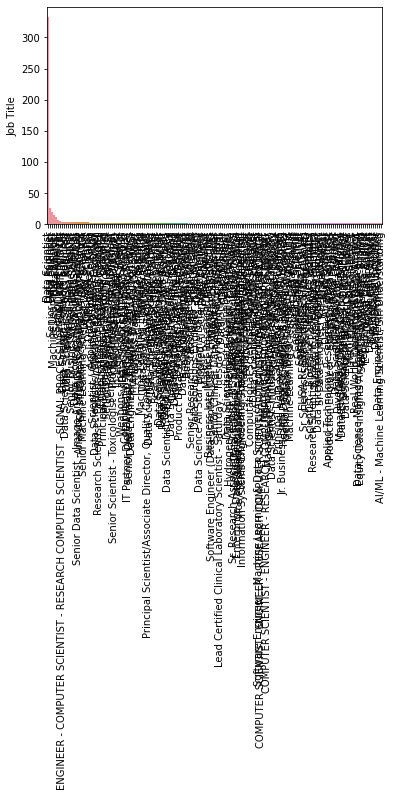

graph for Salary Estimate: total = 30


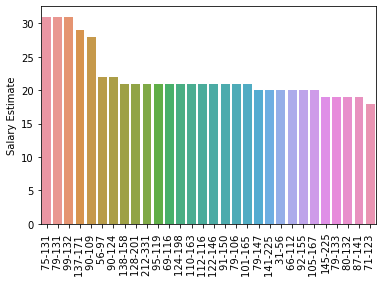

graph for Job Description: total = 481


graph for Rating: total = 32


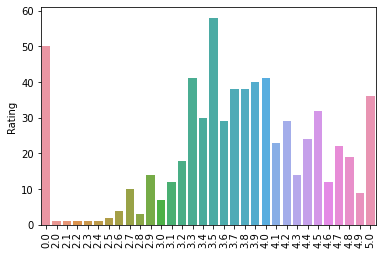

graph for Company Name: total = 425


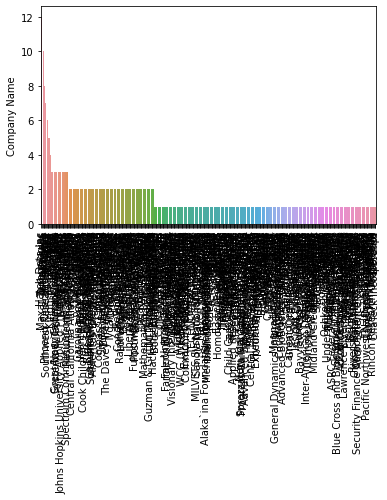

graph for Location: total = 202


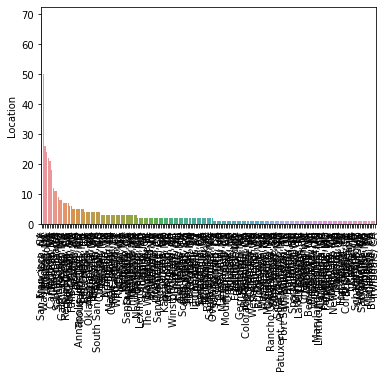

In [47]:
for i in df_cat.columns:
    cat_num = df_cat[i].value_counts()
    print("graph for %s: total = %d" % (i, len(cat_num)))
    chart = sns.barplot(x=cat_num.index, y=cat_num)
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
    plt.show()

In [51]:
df_cat = df[['Job Title', 'Salary Estimate', 'Job Description', 'Rating',
       'Company Name', 'Location', 'Headquarters', 'Size', 'Type of ownership',
       'Industry']]

graph for Location: total = 20


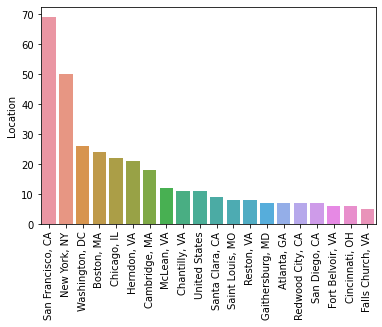

graph for Headquarters: total = 20


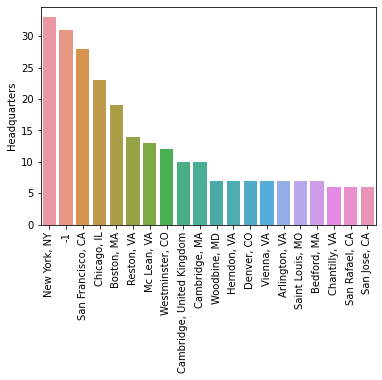

graph for Industry: total = 20


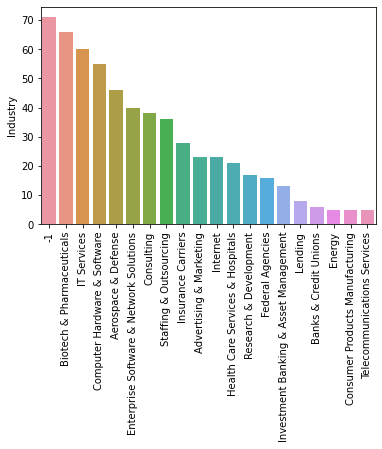

In [52]:
for i in df_cat[['Location','Headquarters','Industry']].columns:
    cat_num = df_cat[i].value_counts()[:20]
    print("graph for %s: total = %d" % (i, len(cat_num)))
    chart = sns.barplot(x=cat_num.index, y=cat_num)
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
    plt.show()

In [53]:
pd.pivot_table(df, index = 'job_simp', values = 'avg_salary')

,avg_salary
job_simp,
analyst,115.527273
data engineer,113.782609
data scientist,125.266219
director,127.000000
manager,137.857143
mle,118.058824
na,127.088235


In [54]:
pd.pivot_table(df, index = ['job_simp','seniority'], values = 'avg_salary')

avg_salary
job_simp       seniority            
analyst        jr          76.000000
               na         116.135135
               senior     116.529412
data engineer  na         114.225000
               senior     110.833333
data scientist na         125.716080
               senior     121.612245
director       na         120.000000
               senior     130.500000
manager        na         140.833333
               senior     120.000000
mle            na         114.960000
               senior     126.666667
na             na         124.466667
               senior     146.750000

In [55]:
pd.pivot_table(df, index = ['job_state','job_simp'], values = 'avg_salary').sort_values('job_state', ascending = False)

avg_salary
job_state job_simp                  
WV        data scientist       114.0
WI        na                   136.0
          data scientist       144.0
          analyst              154.0
WA        mle                  192.5
...                              ...
AZ        data scientist       147.0
          data engineer        115.0
AL        na                   142.0
          data scientist       107.0
          data engineer        133.0

[108 rows x 1 columns]

In [56]:
pd.set_option('display.max_rows', None)
pd.pivot_table(df, index = ['job_state','job_simp'], values = 'avg_salary', aggfunc = 'count').sort_values('job_state', ascending = False)

avg_salary
job_state job_simp                  
WV        data scientist           1
WI        na                       1
          data scientist           4
          analyst                  1
WA        mle                      2
          data scientist          13
          analyst                  1
VA        na                       5
          mle                      5
          data scientist          66
          data engineer            5
          analyst                  8
UT        data engineer            2
          data scientist           1
US        data scientist          10
          data engineer            1
TX        na                       2
          data scientist          12
          analyst                  3
TN        mle                      1
          data scientist           5
          analyst                  2
SC        na                       1
          analyst                  1
RI        director                 2
PA        data scientist           5
          analyst                  4
          na                       1
          mle                      2
OR        mle                      1
          data scientist           1
OK        na                       4
          analyst                  2
OH        na                       2
          mle                      1
          data scientist           9
          data engineer            2
NY        data engineer            4
          analyst                  1
          data scientist          41
          mle                      3
          na                       3
NJ        na                       1
          data scientist           8
          analyst                  1
NH        mle                      1
          data scientist           1
NE        data scientist           2
          analyst                  1
NC        data scientist           1
          na                       3
          mle                      2
          manager                  1
          data engineer            1
          analyst                  1
MS        na                       1
MO        data scientist           9
          data engineer            2
          analyst                  1
MN        data scientist           1
          analyst                  3
MI        manager                  1
          data scientist           4
MD        na                       8
          data scientist          27
          data engineer            3
          analyst                  2
MA        director                 1
          analyst                  1
          data scientist          37
          na                      19
          manager                  1
          mle                      3
LA        analyst                  1
KS        data scientist           1
IN        na                       1
          data scientist           1
          data engineer            1
          analyst                  2
IL        data engineer            2
          analyst                  3
          mle                      3
          na                       3
          data scientist          19
IA        analyst                  3
GA        data scientist           9
FL        na                       2
          data scientist           2
          data engineer            4
DE        data scientist           1
DC        data scientist          25
          analyst                  1
CT        data scientist           2
          data engineer            2
CO        mle                      1
          data scientist           9
CA        na                       8
          mle                      9
          manager                  4
          data scientist         117
          data engineer           15
          analyst                 12
AZ        na                       1
          data scientist           2
          data engineer            1
AL        na                       2
          data scientist      

In [57]:
pd.pivot_table(df[df.job_simp == 'data scientist'], index = 'job_state', values = 'avg_salary').sort_values('avg_salary', ascending = False)

,avg_salary
job_state,
DE,271.000000
NH,161.000000
AZ,147.000000
WI,144.000000
NY,141.560976
DC,139.600000
TX,138.250000
PA,136.600000
NC,136.000000


In [64]:
df_pivots = df[['Rating', 'Industry', 'Sector', 'Revenue', 'python', 'spark', 'aws', 'excel', 'Type of ownership','avg_salary']]
for i in df_pivots.columns:
    print(i)
    print(pd.pivot_table(df_pivots,index =i, values = 'avg_salary').sort_values('avg_salary', ascending = False))

Rating
        avg_salary
Rating            
2.0     148.000000
2.7     145.000000
0.0     134.540000
2.3     133.000000
3.5     130.862069
4.5     129.218750
3.4     128.433333
3.8     128.131579
3.2     127.888889
3.6     127.827586
4.1     126.391304
4.2     125.655172
4.6     123.916667
3.9     123.525000
4.8     122.315789
4.4     122.083333
5.0     120.833333
4.7     120.545455
4.0     119.902439
3.3     119.487805
4.3     117.142857
3.1     115.583333
2.5     114.000000
3.7     110.394737
3.0     106.857143
2.1     106.000000
4.9     105.555556
2.8     103.666667
2.6     103.250000
2.2     103.000000
2.9     102.857143
2.4      99.000000
Industry
                                          avg_salary
Industry                                            
Publishing                                271.000000
Health, Beauty, & Fitness                 203.500000
Food & Beverage Stores                    183.000000
Hotels, Motels, & Resorts                 183.000000
State & Regional Age

ValueError: Grouper for 'avg_salary' not 1-dimensional

In [67]:
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

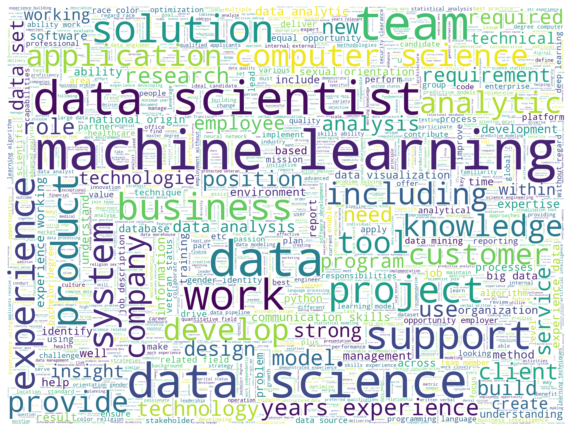

In [69]:
words = " ".join(df['Job Description'])

def punctuation_stop(text):
    """remove punctuation and stop words"""
    filtered = []
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text)
    for w in word_tokens:
        if w not in stop_words and w.isalpha():
            filtered.append(w.lower())
    return filtered


words_filtered = punctuation_stop(words)

text = " ".join([ele for ele in words_filtered])

wc= WordCloud(background_color="white", random_state=1,stopwords=STOPWORDS, max_words = 2000, width =2000
              , height = 1500)
wc.generate(text)

plt.figure(figsize=[10,10])
plt.imshow(wc,interpolation="bilinear")
plt.axis('off')
plt.show()